# Breast Cancer Classification
## based on histopathological images
Robin Demesmaeker


## INTRODUCTION

</br>
<div style="text-align: justify"> 
Automatic disease classification based on medical data is becoming one of the hot topics in research. Indeed, nowadays clinicians spend a lot of their time analysing data such as medical images for disease diagnosis. Providing a tool for computer assisted disease classification would alleviate this extremely time-consuming task. Since the patient’s life could depend on the correctness of the classification result, it is primordial to achieve very high classification accuracies and especially a high sensitivity. In this project, classification of breast tumors will be studied on a new large database of pathohistological images containing different types of benign and malignant tumors. After acquiring and exploring this dataset, both binary and multi-class classification will be considered using convolutional neural networks.
</div>

## IMPORT ALL LIBRARIES
</br>
<div style="text-align: justify">
Before starting with the data acquisition, all Python modules necessary for the main script are loaded (the self-written modules also include import statements). For a complete list, please consult the <b>requirements.txt</b> file.
</div>

In [1]:
% matplotlib inline

import numpy as np
import pandas as pd
import tensorflow as tf
import os
import skimage.io as imageio
import skimage.color as color
import skimage.transform  as trf
import collections
from matplotlib import pyplot as plt
from matplotlib import cm
import sqlalchemy as sql
import sklearn.feature_extraction.image as skfeim
import random
import scipy.io as sio

imageio.use_plugin('matplotlib')

from ipywidgets import FloatProgress
from IPython.display import display
import time
import gc

%load_ext autoreload
%autoreload 2
import acquisition as acq
import cnn
import utils
import models


## DATA ACQUISITION

</br>
<div style="text-align: justify"> 
The data that will be used in this project is contained in the BreaKHis database [1]. This database, which has
been published only very recently, has as objective to provide data scientists with a benchmarking dataset for their classification algorithms in the context of breast cancer histology. In [2] and [3], some results have already been presented using this dataset. This database is freely and publically available, but an email should be sent to the authors in order to get the link to the data (see <i>http://web.inf.ufpr.br/vri/breast-cancer-database</i>).
After following the steps listed on the previous webpage, the result is a folder containing some text files and folders **fold1-5** with the training and test images for 5 different standardized folds. 
</div>
<div style="text-align: justify"> 
According to the authors, the dataset consists of 7909 RGB images with size 460x700 pixels and belonging to 82 different patients. Since this represents a very (/too) large amount of data to work with on a personal laptop, all images are donwsized in the following. It should be noted, however, that downsizing means a loss of information and therefore this might decrease the performance of classification models.
</div>

<div style="text-align: justify"> 
Below, some constants are defined such as the short and long names for the main types of tumors, i.e. benign and malignant, and their subtypes, the first 4 being benign and the latter 4 being malignant. The dataset is composed of images at 4 different magnification levels.
</div>
<div style="text-align: justify"> 
Furthermore, new image sizes are defined, namely a 4x4 downsizing and a 2x2 downsizing. Also patch sizes and patch numbers are defined. The meaning of these constants will become clear further on in this notebook, but are necessary here to build a useful sqlite database.
</div>

In [2]:
TYPES_SHORT = ['B','M']
TYPES_LONG = ['Benign','Malignant']
SUBTYPES_SHORT = ['A','F','TA','PT','DC','LC','MC','PC']
SUBTYPES_LONG = ['Adenosis','Fibroadenoma','Tubular Adenoma',
                 'Phyllodes Tumor', 'Ductal Carcinoma', 'Lobular Carcinoma', 
                 'Mucinous Carcinoma', 'Papillary Carcinoma']
MAGNIFICATIONS = ['40X','100X','200X','400X']

IMAGE_SIZE_1 = (115,175)
PATCH_SIZE_1 = (32,32)
PATCH_NUMBER_1 = 20

IMAGE_SIZE_2 = (230,350)
PATCH_SIZE_2 = (32,32)
PATCH_NUMBER_2 = 100

<div style="text-align: justify"> 
Indeed, before starting the exploration of the data, sqlite databases are generated to provide a way to have the data together instead of in separate **.png** files and annotation **.txt** files. A database is created for each magnification - they will always be used separately - at each of the image sizes mentioned above. The columns in the tables are the following: 
</div>

- *filename*: the filename of the png image
- *type*: the type, i.e. B or M
- *subtype*: the subtype of the tumor, i.e. one of SUBTYPES_SHORT
- *patient*: the patient ID
- *patient_slice*: the slice number of this image
- *image*: the resized image in np.ndarray BLOB format
- *mean*: the mean of each channel, i.e. a 3D vector
- *patches*: a 4D np.ndarray BLOB format with all extracted patches (see later on)
- *fold1 - fold5*: for each fold whether the image belongs to the 'train' or 'test' set 

In [3]:
BUILD_SQL = False #set to True if databases have to be (re)generated

if BUILD_SQL:
    acq.generate_databases(os.path.join('..','Data','mkfold'), IMAGE_SIZE_1, PATCH_SIZE_1, PATCH_NUMBER_1)
    acq.generate_databases(os.path.join('..','Data','mkfold'), IMAGE_SIZE_2, PATCH_SIZE_2, PATCH_NUMBER_2)


**REMARK: ** Although the authors say that the dataset consists of only images with size 460x700, there are also some images with size 459x699. This is an inconsistency between the dataset description and the real content. Here these images were simply rescaled to IMAGE_SIZE_1 and IMAGE_SIZE_2.

Data cleaning is not necessary as the publisher already cleant the data in order to make this dataset useful for benchmarking. However, it will be shown in a later step that there is still a need for some cleaning due to an inconsistency within the dataset.

## DATA EXPLORATION

</br>
<div style="text-align: justify"> 
Now, it is important to get a sense for the data we are working with. In order to do this, several data exploration steps will be undertaken. The first of which is exploring the distribution of the images and patients between the different cancer categories. The results can be seen in the figures below for each of the magnification levels; the pie charts represent the distribution of the images across the different types and subtypes. It is clear that the data is not equally distributed over the different classes. Indeed, the benign population is less than half as large as the malignant population. Moreover, within the same global class, the distributions are not uniform. Especially the fact that the Ductal Carcinoma group is much larger than the other malignant groups is noteworthy. On the other hand, the distributions are rather constant across the 4 magnification levels. This is due to the fact that the same patients are studied at all magnification levels and the number of images per patient per magnification level does not vary a lot. Some inconsistencies can also be seen and are discussed next.
</div>

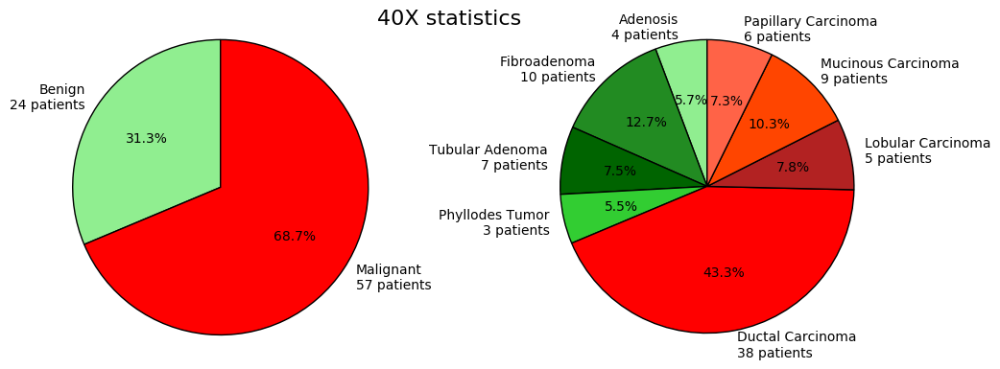

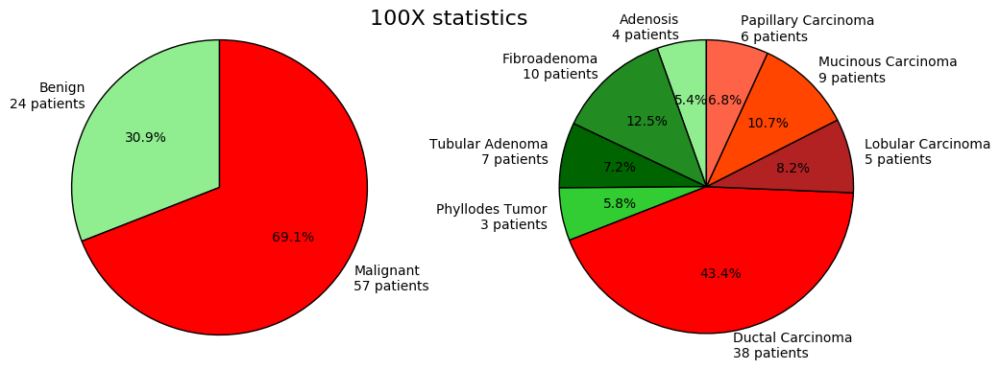

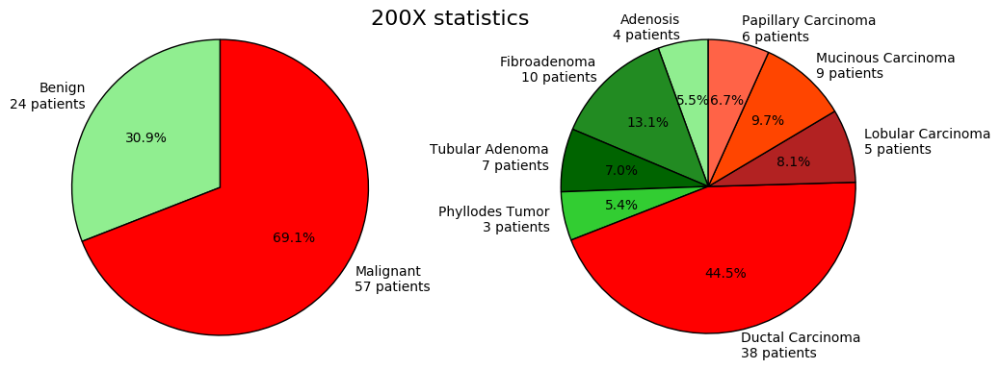

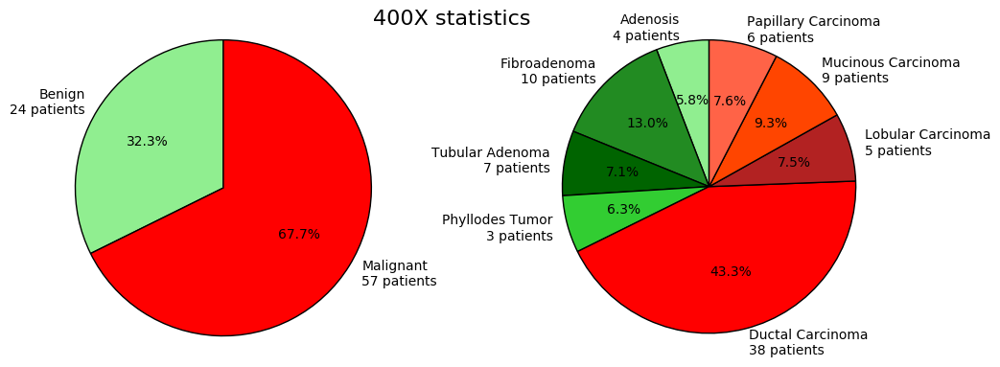

In [4]:
utils.make_statistics_plots(IMAGE_SIZE_1, MAGNIFICATIONS, TYPES_SHORT, TYPES_LONG, SUBTYPES_SHORT, SUBTYPES_LONG)

#### Inconsistencies
</br>
<div style="text-align: justify"> 
First of all, comparing the above statistics with what was reported in the original paper, the numbers for Tubular Adenoma and Phyllodes Tumor are interchanged. By double checking the database, it can be concluded that the numbers shown here are correct.
</div>
</br>
<div style="text-align: justify"> 
Secondly, if one takes the sum over all patients in the pie charts, the sums from the left and right figures are different, i.e. 81 and 82. This is completely unexpected since they represent the same database and therefore, this could mean that there is a problem with the BreaKHis database. Indeed, after a more thorough look at the data, it was found that patient 13412 is in both the Lobular Carcinoma and Ductal Carcinoma groups. This could have meant that the patient ID is only unique within a cancer subtype and not over the whole database. However, the images are exactly the same in both groups, e.g. SOB_M_LC-14-13412-400-001.png and SOB_M_DC-14-13412-400-001.png, though the number of images differs by 1. Arguably, this is a mistake in the database. It was decided to discard this patient in what follows since this mistake could have major effects on the algorithms and results. Imagine for example that a multi-class classification model is trained with this patient in one category and then tested with the same patient in another category, this would introduce a huge prediction error.
</div>

In [5]:
DO_CLEAN = False #set to True if databases should be (re)generated
if DO_CLEAN:
    for image_size in [IMAGE_SIZE_1, IMAGE_SIZE_2]:
        for m in MAGNIFICATIONS:
            print('Clean '+str(image_size[0])+'_'+str(image_size[1])+'_'+m)
            acq.remove_patient_from_database('13412', image_size, m)

For completeness, the corrected distributions are shown below.

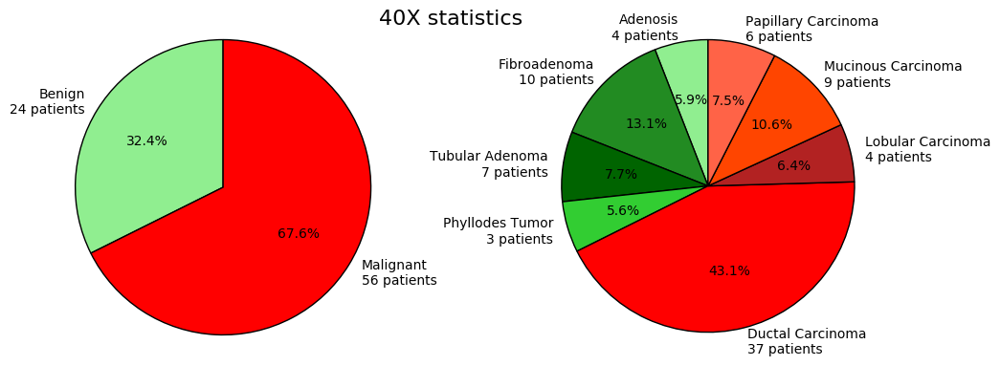

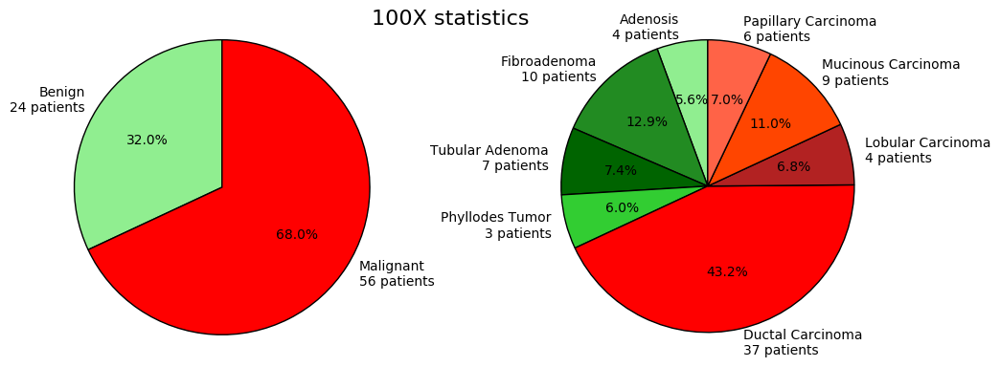

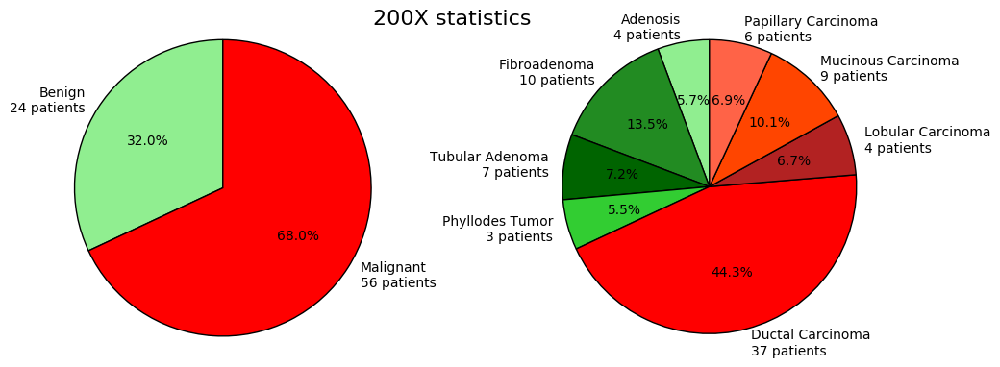

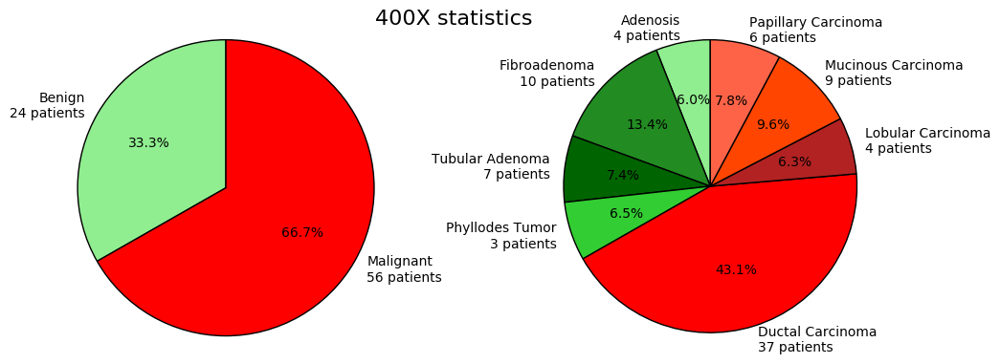

In [6]:
utils.make_statistics_plots(IMAGE_SIZE_1, MAGNIFICATIONS, TYPES_SHORT, TYPES_LONG, SUBTYPES_SHORT, SUBTYPES_LONG,clean=1)

As we are dealing with images, it is also important to have a look at them. The next piece of code shows images for the different magnifications and tumor subtypes.

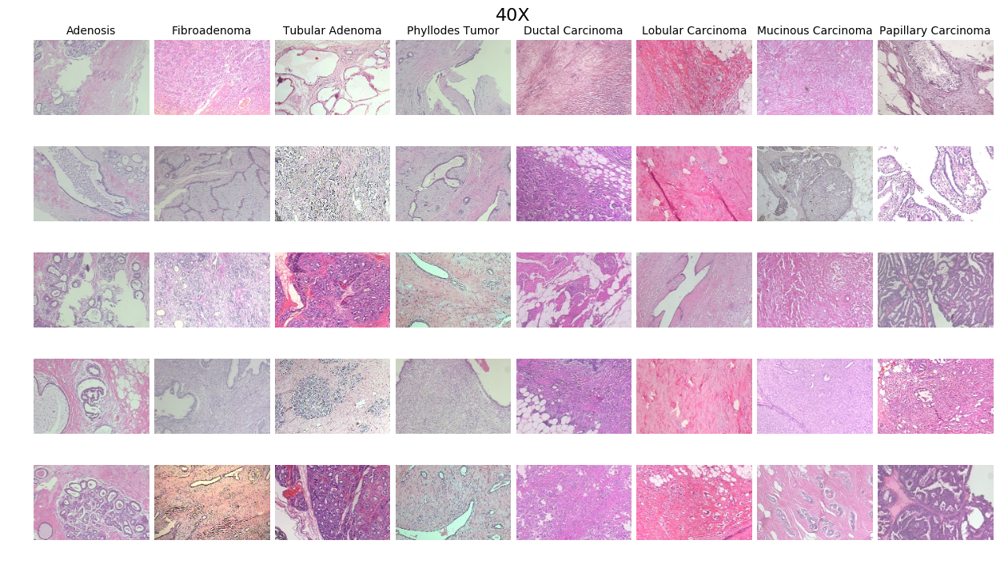

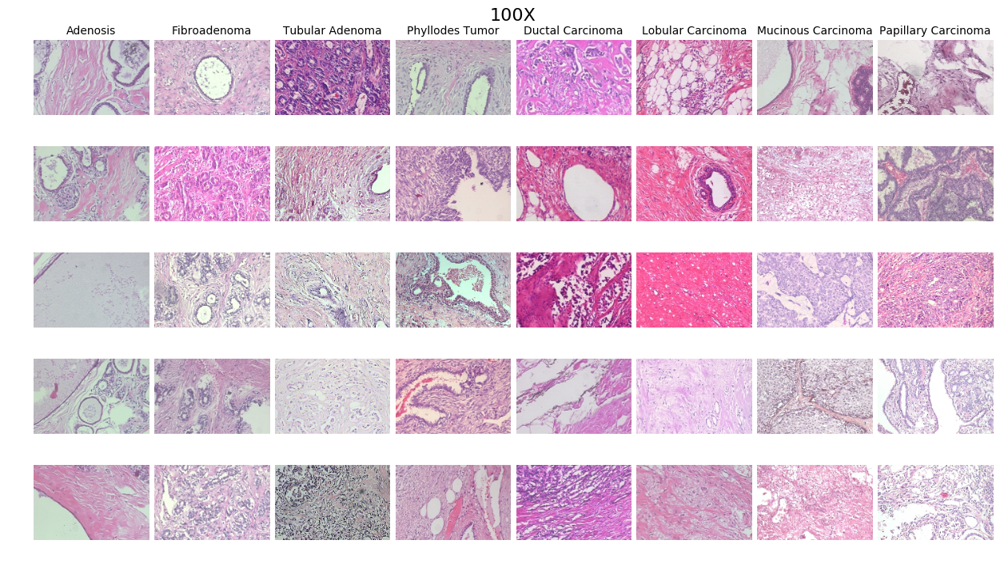

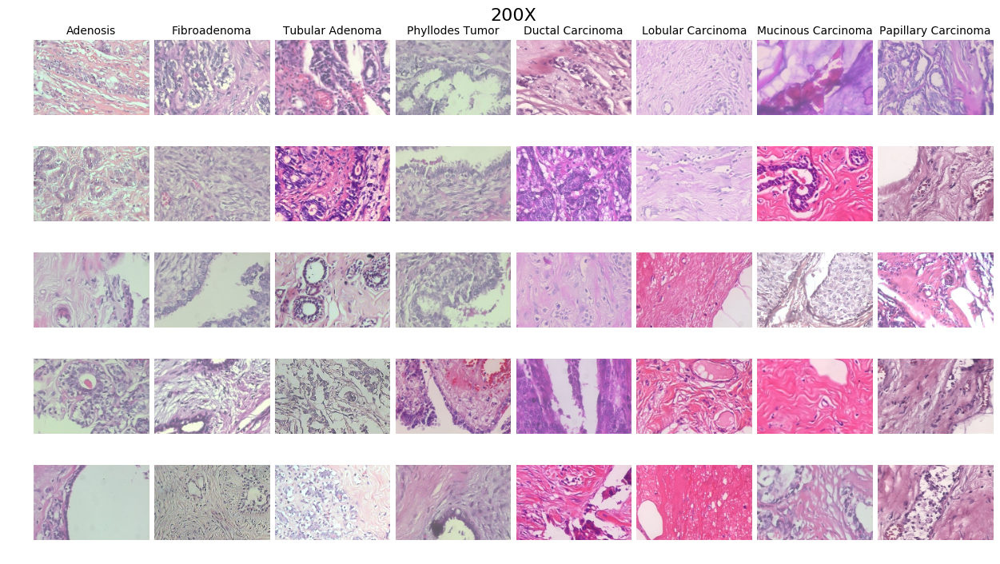

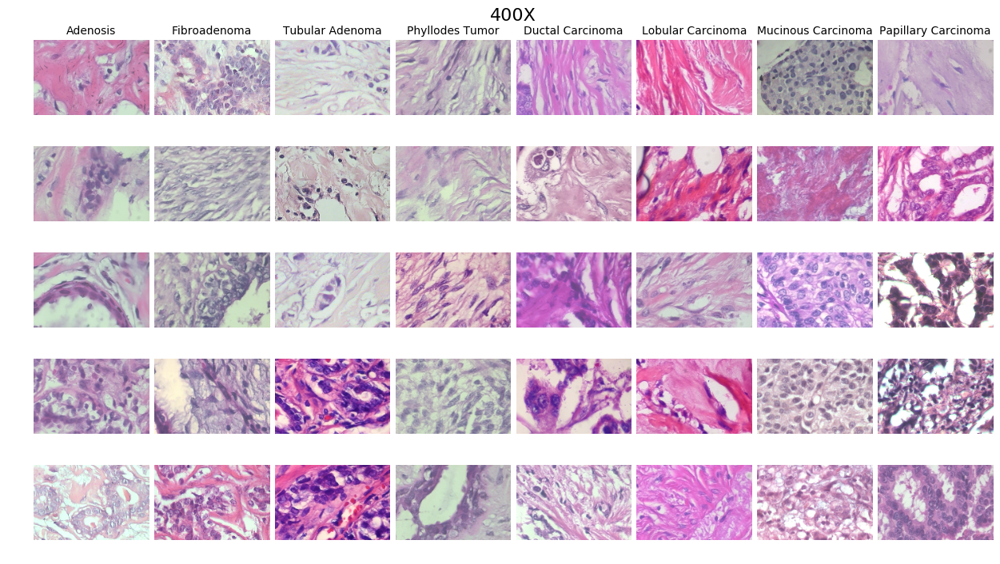

In [7]:
NUMBER_PER_CLASS = 5
for m in MAGNIFICATIONS:
    engine = sql.create_engine('sqlite:///'+str(IMAGE_SIZE_1[0])+'_'+str(IMAGE_SIZE_1[1])+'_'+m+'_clean.sqlite', echo=False)
    df = pd.read_sql('images',engine,columns=['subtype','image'])
    utils.make_example_plot(df, IMAGE_SIZE_1, m, NUMBER_PER_CLASS)
del(df)

</br>
<div style="text-align: justify"> 
By observing the images above, it is immediately clear that they are very heterogeneous, even within the same cancer subtype. The overall color of the images varies a lot, from light purple to very dark purple, but there is no apparent link between the general color and the class the image belongs to. No straightforward texture differences are visible neither. Without an in-depth knowledge of histology and oncology, it seems very difficult to classify these images into the right class.
</div>

<div style="text-align: justify"> 
In the following figures, data exploration is done by calculating some simple features. Here, the results are shown for the 400X magnification level of the 230x350 resized images, but they can be generated for the others as well by simply changing the **M**. 
</div>
<div style="text-align: justify">
In the first figure, the mean and standard deviation histograms of the different color components (RGB) of all images are shown. This is mainly a sanity check to see if there are images that lie far away from the others. As expected from the visual representations above, the distributions are rather broad. They seem monomodal (except maybe the means of the G component) and as such, based on these histograms no data separation is apparent. There are only very few images that seem to be outliers to the global distribution.
</div>
<div style="text-align: justify">
In the second figure, a scatterplot of the mean and standard deviation of all images converted to grayscale is shown with the different colors representing the cancer subtypes. In this plot no apparent clusters are visible, nor at the level of benign or malign, i.e. shades of green or red, nor at the level of the subtypes.
</div>
<div style="text-align: justify">
The third figure is discussed below.
<div>

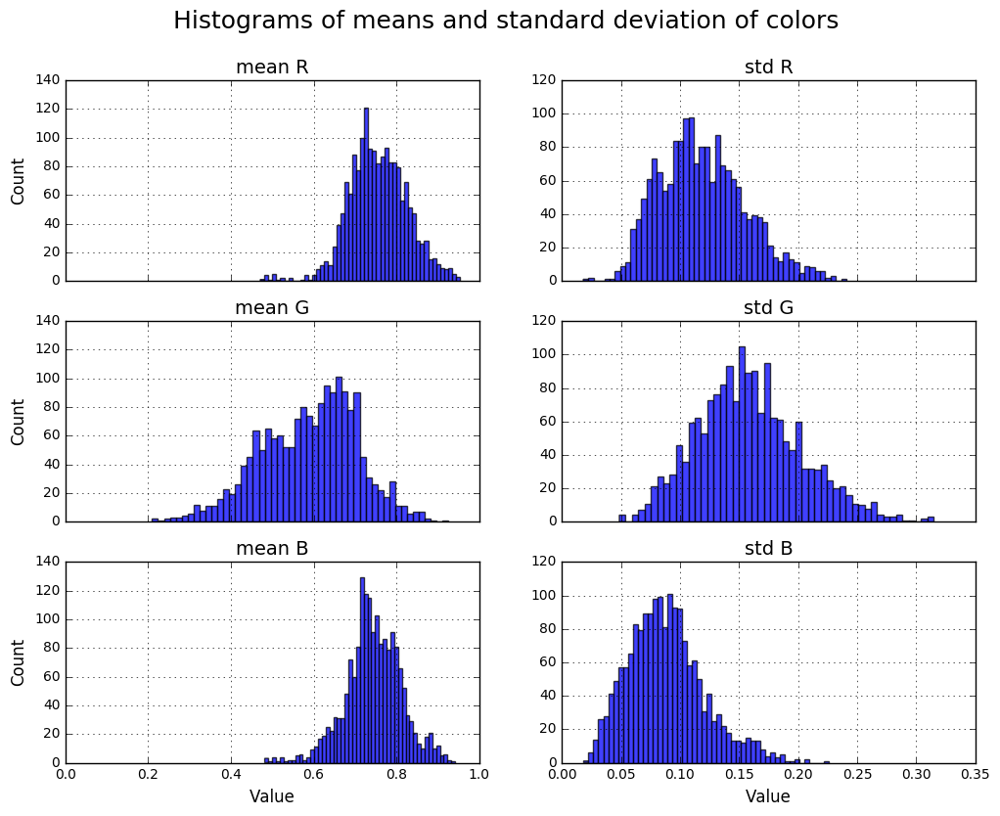

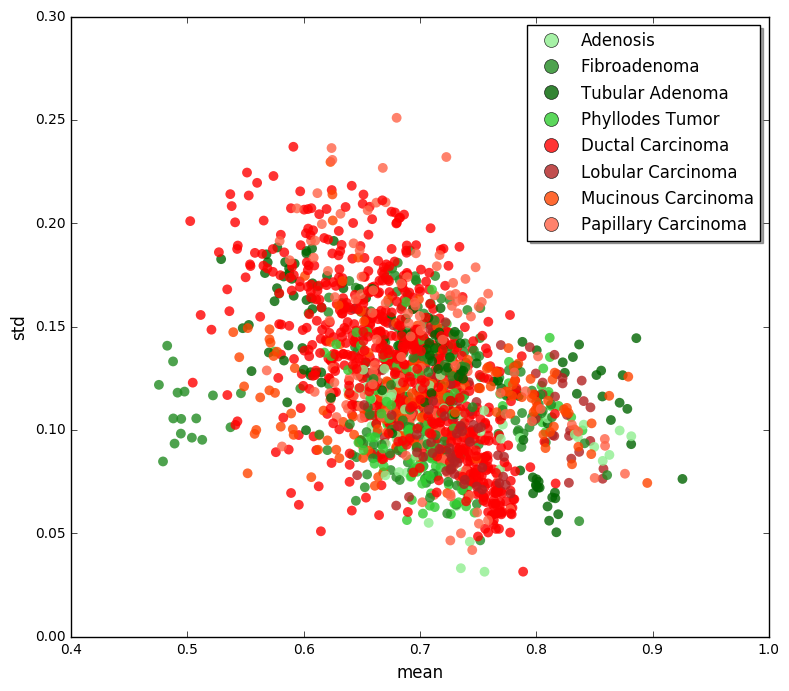

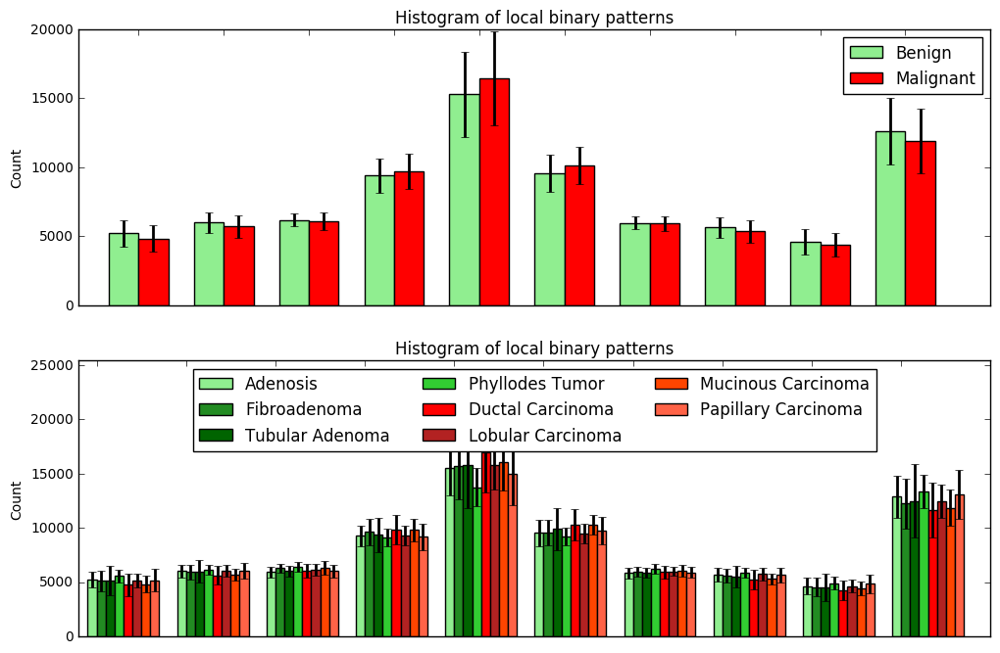

In [8]:
M = '400X'
IMAGE_SIZE = IMAGE_SIZE_2
utils.make_exploration_figures(IMAGE_SIZE, M, TYPES_SHORT, TYPES_LONG, SUBTYPES_SHORT, SUBTYPES_LONG)



<div style="text-align:justify">
Other simple features that could be used for classification are texture descriptors. For example, the histogram of local binary patterns, LBPs, is widely used for image classification where the texture of the image contains a lot of information. Here the histograms of the uniform rotation-invariant LBPs (8 neighbours) are calculated and their means and standard deviations over the different classes are shown above. Here again, no large differences between the different classes are visible and it can be concluded that good classification based on these features is difficult to achieve. In [1] these features have also been used and binary classification accuracies of between 68.8% and 75.6% have been reported. These numbers are indeed not large knowing that due to the unbalanced data, classifying everything as malignant would already yield around 67% accuracy. It should be noted that in this paper, Parameter-Free Threshold Adjacency Statistics (PFTAS) turned out to be the best features to train a classifier on. However, these formed a 162 dimensional feature vector, stressing the fact that a lot of different features are needed to achieve good classification accuracy and therefore confirming that a few simple features do not provide enough information for good classification.
</div>

## DATA EXPLOITATION

### CONVOLUTIONAL NEURAL NETWORKS
</br>
<div style="text-align: justify"> 
Traditional classifier models like kNN, SVM, discriminant analysis classifiers, ..., require the calculation of predefined features which contain the main discrimant information about the data before training and testing the model. Neural networks on the other hand integrate the feature calculation into the model training and learn the important features themselves by backpropagation. In the context of computer vision, convolutional neural networks are nowadays widely used. These networks learn convolutional kernels to extract low-level image features such as borders in the first layers and more high-level features like general forms in the deeper layers. These high-level features are then fed to fully connected layers to provide the final classification result. This automatic learning of a highly informative internal representation of the images is the main advantage of neural networks. In this project, the choice was made to work with (deep) convolutional neural networks to attempt the breast cancer classification.
</div>

### PATCH-BASED CLASSIFICATION
</br>
<div style="text-align:justify">
Since using the full images, or even the 115x175 resized images, as the input to a deep neural network would be extremely computationally demanding, patches of 32x32 pixels were extracted from these images and used as input to the networks. The outputs of the network for all patches can then be combined to yield the general image-wise classification result. The patches were extracted in a random manner. 20 patches were extracted for the 115x175 images and 100 patches for the 230x350 images in the hope to have information from the whole image (indeed, 20x30x30 is a bit higher than 115x175), but due to the randomness this will be a bit lower. A higher amount of patches could be chosen and would definitely yield a better performance of the models. However, this would also imply much longer training and testing times. It should be kept in mind that for a real implementation of the models, i.e. when gpu computing and large working memories are available, it would be better to use more patches per image and a higher resolution to achieve higher accuracy.
</div>



<div style="text-align:justify">
In the figures below an example of this patch extraction is shown.
</div>

522

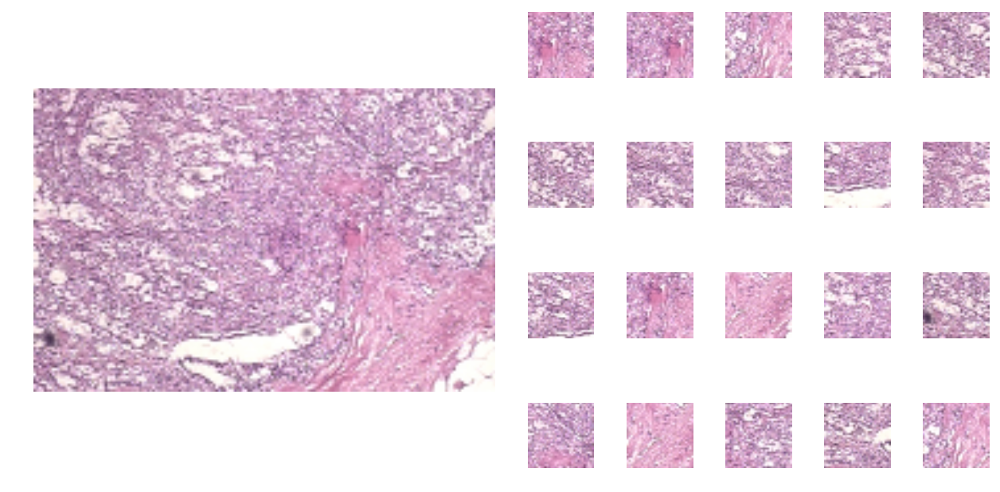

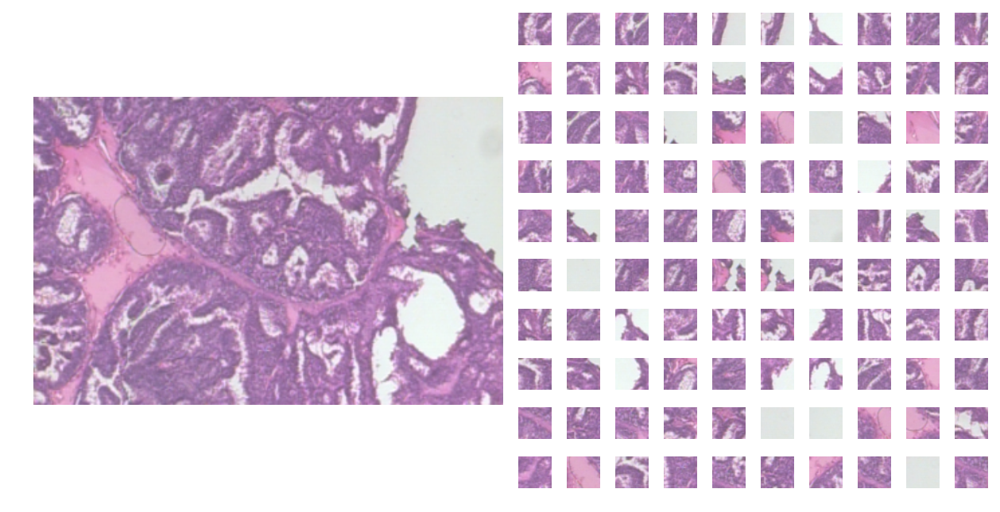

In [9]:
M='40X'


engine = sql.create_engine('sqlite:///'+str(IMAGE_SIZE_1[0])+'_'+str(IMAGE_SIZE_1[1])+'_'+M+'_clean.sqlite', echo=False)
df = pd.read_sql('images',engine,columns=['subtype','image','patches'])
utils.make_example_patches_plot(df, IMAGE_SIZE_1, PATCH_SIZE_1, PATCH_NUMBER_1)
del(df)
engine = sql.create_engine('sqlite:///'+str(IMAGE_SIZE_2[0])+'_'+str(IMAGE_SIZE_2[1])+'_'+M+'_clean.sqlite', echo=False)
df = pd.read_sql('images',engine,columns=['subtype','image','patches'])
utils.make_example_patches_plot(df, IMAGE_SIZE_2, PATCH_SIZE_2, PATCH_NUMBER_2)
del(df)
gc.collect()

### IMPORT DATA

<div style='text-align: justify'>
In order to keep the training and testing times within acceptable limits and in order not to have an oversized notebook, the models are developed on the 115x175 images, 400X magnification and the first train-test fold. All these parameters can easily be modified below if the reader wants to see the results for other parameters. The data are loaded, split into training and test sets and converted to the required input format for the models.
</div>

In [10]:
## define train and test data
MAGNIFICATION = '400X'
IMAGE_SIZE = IMAGE_SIZE_1
PATCH_NUMBER = PATCH_NUMBER_1
PATCH_SIZE = PATCH_SIZE_1
FOLD = 'fold1'

In [11]:
## load data from database
engine = sql.create_engine('sqlite:///'+str(IMAGE_SIZE[0])+'_'+str(IMAGE_SIZE[1])+'_'+MAGNIFICATION+'_clean.sqlite', echo=False)

df = pd.read_sql('images',engine)
df_train = df.loc[df[FOLD]=='train'].copy().reset_index(drop=True)
df_test = df.loc[df[FOLD]=='test'].copy().reset_index(drop=True)
del df

In [12]:
## convert data to useful format
train_data, train_labels_bin, train_labels_all, _ = utils.convertToNDArray(df_train, PATCH_NUMBER, PATCH_SIZE)
test_data, test_labels_bin, test_labels_all, test_patients = utils.convertToNDArray(df_test, PATCH_NUMBER, PATCH_SIZE)

## convert labels to one hot
train_labels_bin = utils.convert_to_one_hot(train_labels_bin, 2)
test_labels_bin = utils.convert_to_one_hot(test_labels_bin, 2)
train_labels_all = utils.convert_to_one_hot(train_labels_all, 8)
test_labels_all = utils.convert_to_one_hot(test_labels_all, 8)

## vectorize input
train_data_vec=train_data.reshape((train_data.shape[0],PATCH_SIZE[0]*PATCH_SIZE[1]*3))
test_data_vec=test_data.reshape((test_data.shape[0],PATCH_SIZE[0]*PATCH_SIZE[1]*3))


### BUILDING THE MODEL
Inspired on [2], a convolutional neural network is built with 3 convolutional layers and 2 fully connected layers. The network overview is shown in the figure below:



![Model 1](model_1.png)

<div style="text-align:justify">
The 32x32x3 patches are fed to a first convolutional layer with 32 kernels. Subsequently max pooling with a 3x3 receptive field and subsampling by a factor 2 is carried out. This result is then the input of a second convolutional layer with the same parameters, but with average pooling instead of max pooling. Then, a final convolutional layer with 64 kernels and again average pooling gives a 4x4x64 tensor. Two fully connected layers followed by a softmax operator yield the final output where the elements of the vector represent the probability of each class.
</div>
The following predictions can be calculated with $y_{patch}$ being the output of the final softmax layer in the networks:

$$ \text{patch prediction}=\text{argmax}(y_{patch})$$
$$ \text{image prediction}=\text{argmax}\left(\sum_{i=1}^{N_{patch}}y_{patch,i}\right)$$
$$ \text{patient prediction}=\text{argmax}\left(\sum_{i=1}^{N_{images}}\sum_{j=1}^{N_{patch}}y_{patch,i,j}\right)$$

### TRAINING AND TESTING THE MODEL

<div style='text-align: justify'>
The model is trained by using minibatches of 100 randomly selected patches of which the global image means are subtracted. The value that is optimised is the cross-entropy between the ground truth and the softmax output. An ADAM optimizer is used with learning rate 0.001 (this value has been chosen after trying out multiple values). Every 100 iterations, the results are presented and every 500 iterations, the complete test set is sent through the network in order to get the test accuracy. The initialisation of the weight tensors is done using Xavier initialisation, i.e. normalising the variance in each layer, and the biases are all initialised to zero.
</div>
<div style='text-align: justify'>
Since some figures can say more than a million words, the results are always presented in a graphical way while the model is being trained and tested. The following results are shown:
</div>
- **loss value**: the cross-entropy loss, this value should go down for increasing iterations.
- **patch minibatch accuracy**: the accuracy for each minibatch, should go up and reach 1 in case of no dropout.
- **patch minibatch ROC plot**: the sensitivity and 1-specificity are shown. Since this we are in a medical context, very high sensitivity is prefered rather than very high specificity, but ideally both should be 1, i.e. corresponding to the top left corner in the figure. Dark red represent very recent samples while light points represent older samples from the beginning of the training.
- **patch test accuracy and ROC plot**: patch classification accuracy, sensitivity and specificity on test set.
- **image test accuracy and ROC plot**: image classification accuracy, sensitivity and specificity on test set.
- **patient test accuracy and ROC plot**: patient classification accuracy, sensitivity and specificity on test set.
- **image prediction**: the predicted image classes together with the ground truth.

#### RUNNING THE INITIAL MODEL

In this step, the model is run for binary classification without dropout, i.e. without regularisation, to check whether the model is able to overfit the training data.

In [13]:
NUMBER_ITERATIONS = 10001

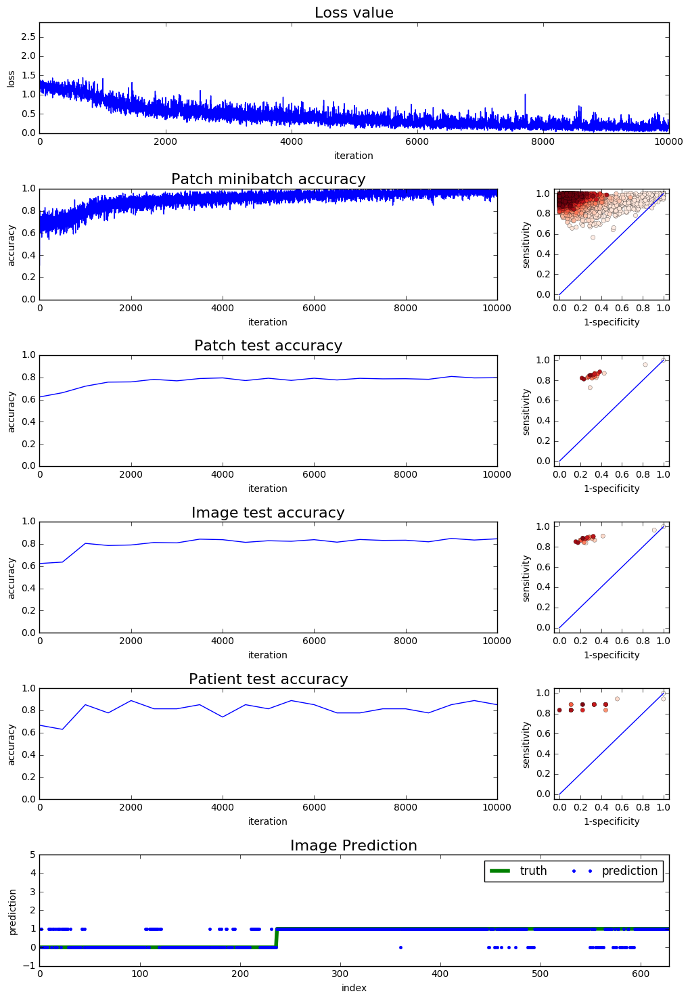

In [14]:
STRIDES = 'pool'
DROPOUT_KEEP = 1
CORRECTION = 0

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_bin, test_data_vec, test_labels_bin, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_binary_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

<div style='text-align:justify'>
Interesting observations follow from this first simulation. First of all it is clear that the model is able to overfit -though not permanently- the training data as can be seen from the minibatch accuracy plot which touches the value 1.0. Secondly, the test accuracies are larger than 80%, which is comparable to the results in [1] where the images had size 230x350 instead of 115x175 here. The patient accuracy is higher than the image accuracy, which is higher than the patch accuracy. This means that the neural network output averaging increases the prediction accuracy as could be expected. A third observation is the fact that from the ROC plot, initially a high sensitivity is combined with a low specificity and that it is mainly the specificity that increases during the training. This is a result from the unbalanced training data. Indeed, without knowing anything about the data, it is better to label everything as malignant rather than choosing a label randomly. The network immediately learns this property of the data and therefore, initially the sensitivity is 1 and the specificity is 0.
</div>

#### A SLIGHT MODIFICATION OF THE MODEL
Since this first simulation takes a lot of time, i.e. more than 36 minutes for training alone (this is really small in real applications, but too slow to test several setups for this project), the subsampling was taken into the convolution instead of in the pooling. This lowers drastically the computation time of the convolutions. Of course, it should be checked that the performance of the model is not affected. Therefore, the previous simulation is repeated with the modified network:

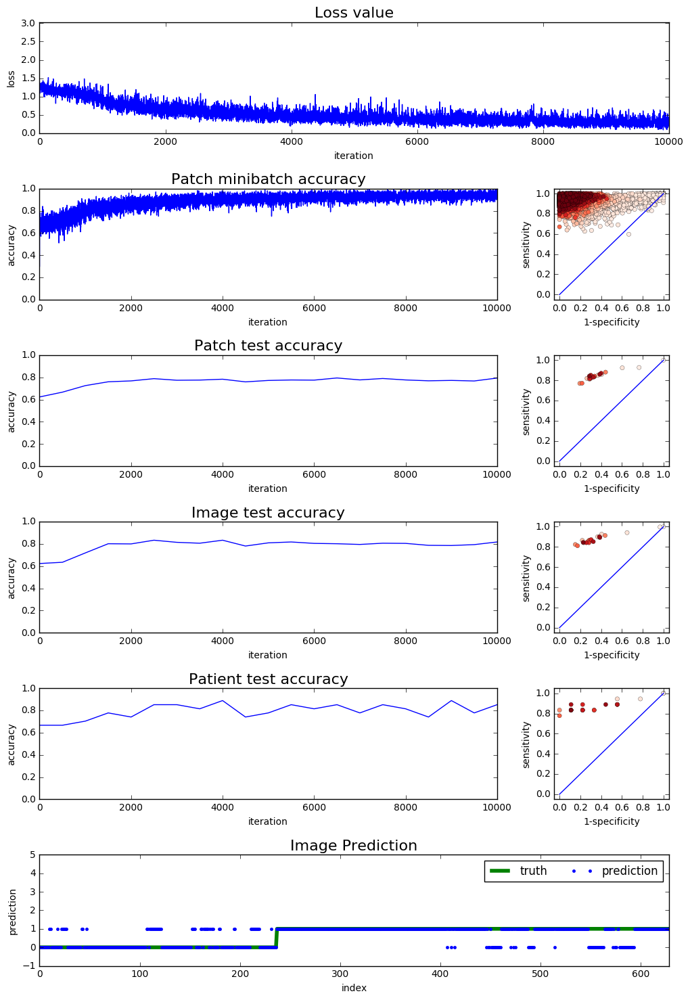

In [15]:
STRIDES = 'conv'
DROPOUT_KEEP = 1
CORRECTION = 0

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_bin, test_data_vec, test_labels_bin, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_binary_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

<div style='text-align:justify'>
As can be expected, the accuracy is a bit affected by the change in the network, but the difference is rather minimal and therefore this network is used in the following steps.
</div>


#### CORRECTING THE BIAS
<div style='text-align:justify'>
As already mentioned, the unbalanced training data influences the way the network learns. Indeed, instead of jointly increasing sensitivity and specificity, it starts from maximal sensitivity and increases the specificity while learning. It is interesting to see whether correcting this bias by dividing the elements in the cross-entropy sum by the respective class probabilities could yield better performance.
</div>

$$\text{modified cross-entropy} = -\sum(\text{distribution}^{-1} * y_{truth} * log(y_{softmax}), 1) \text{ with * the elementwise vector multiplication}$$

This is done in the next simulation:


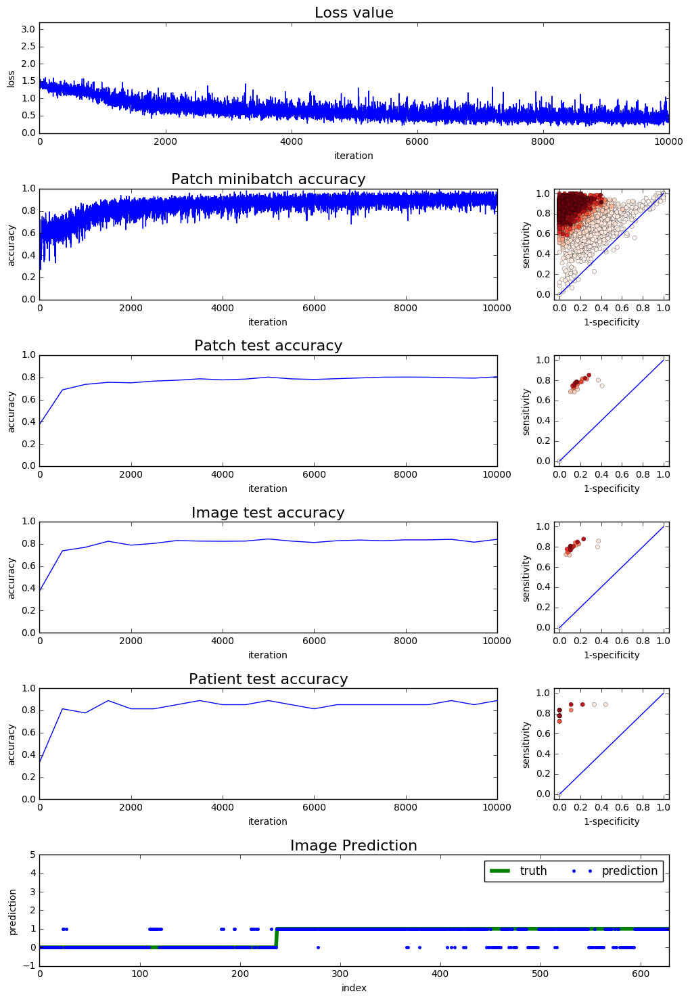

In [16]:
STRIDES = 'conv'
DROPOUT_KEEP = 1
CORRECTION = 1

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_bin, test_data_vec, test_labels_bin, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_binary_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

<div style='text-align:justify'>
It can be seen that the correction effectively counterbalances the unbalanced training data. Indeed, on the ROC curve it is clear that the network converges more symmetrically in sensitivity and specificity. The accuracies are now slightly higher, but the sensitivities are lower. Since the sensitivity is primordial in medical applications and because the difference in accuracy is not extreme, it was chosen not to use this bias correction in what follows and as such to exploit this intrinsic bias to obtain good selectivity. Moreover, this bias correction seems to slow down the convergence.
</div>

#### Using dropout
<div style='text-align:justify'>
In order to regularise the network while training, dropout is the standard approach. The aim is to increase the test accuracy by avoiding overfitting of the training data. Different values for the probability of keeping were tried out, but none yielded much better results, again keeping in mind that high sensitivity is primordial. It should be stressed that the test accuracies without dropout are already high considering the literature and the fact that the images are downsized. Below the simulation is done for a dropout probability of keeping 0.7:
</div>

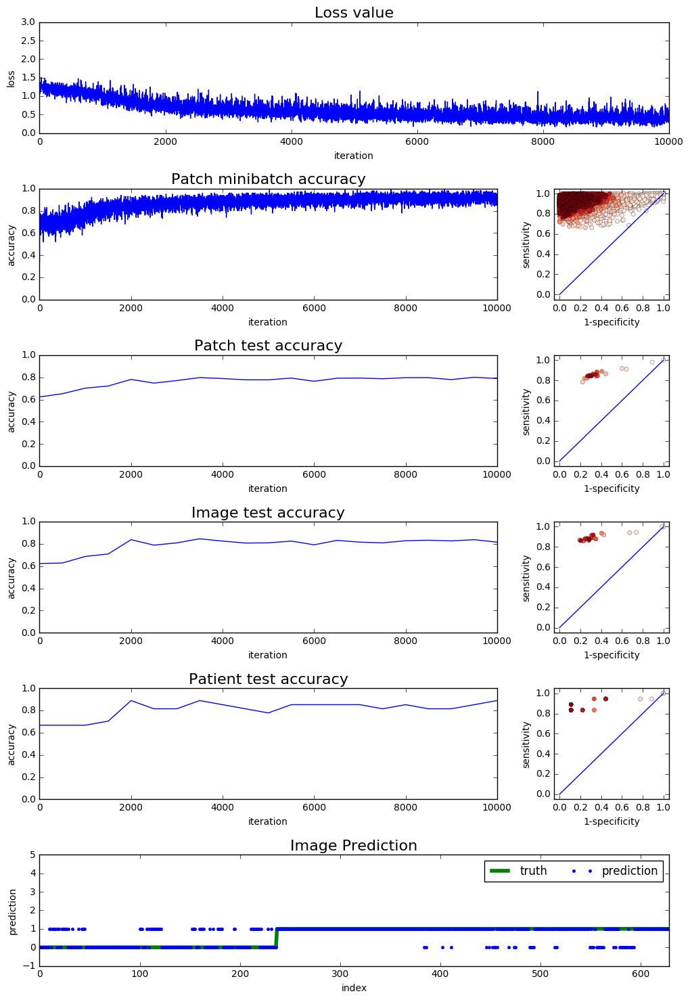

In [17]:
STRIDES = 'conv'
DROPOUT_KEEP = .7
CORRECTION = 0

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_bin, test_data_vec, test_labels_bin, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_binary_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

#### MULTICLASS CLASSIFICATION

<div style='text-align:justify'>
Now, multiclass classification is attempted with the same network structure. Now the question is: how well can the network discriminate between the different tumor subtypes? The same simulations are done as for the binary classification, i.e. without and with dropout. The number of iterations is limited to 15001, although there is no overfitting yet in the case without dropout. Arguably, if time would have allowed, more iterations would have been done.
It is important to note that the sensitivity and specificity are again calculated on the binary level. So even if a malignant tumor has been classified in the wrong, though still malignant, subclass, this is taken into account for the sensitivity.
</div>

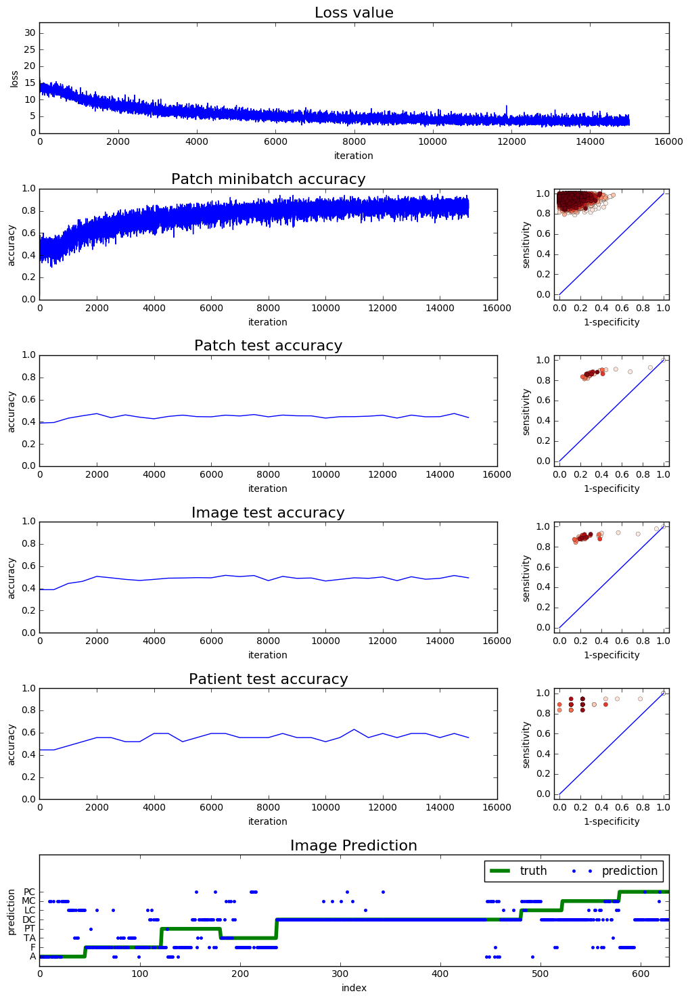

In [18]:
NUMBER_ITERATIONS = 15001
STRIDES = 'conv'
DROPOUT_KEEP = 1
CORRECTION = 0

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_all, test_data_vec, test_labels_all, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_multi_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

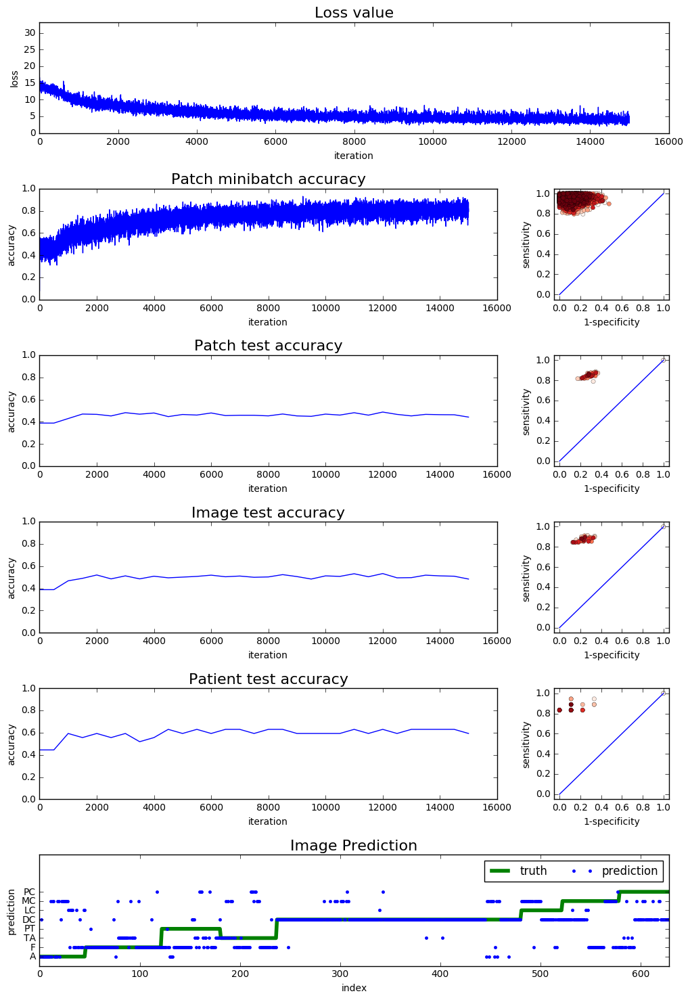

In [19]:
STRIDES = 'conv'
DROPOUT_KEEP = .7
CORRECTION = 0

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_all, test_data_vec, test_labels_all, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_multi_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

<div style='text-align:justify'>
It can be seen that the patient-wise test accuracy is around 60%. Since multi-class classification on this dataset is not yet presented in the literature, it is difficult to say whether or not this is a good result or not. What can be said by looking at the image prediction plot though, is that the DC class is almost entirely correct, but for example the PC class is almost entirely predicted as DC. This points at biases in the prediction. However, the global sensitivities and specificities are comparable or even higher than in the binary classification. This means that a wrongly classified sample is most probably classified in a subtype within the same global class.
</div>

<div style='text-align:justify'>
Below, the 230x350 images and corresponding patches (100 per image) are used to see if the downsizing had a large effect. It is clear from the simulation that this is not the case, the accuracies are not significantly different from the results obtained with the downsized images, but the sensitivities are a bit higher.
</div>

In [20]:
## define train and test data
MAGNIFICATION = '400X'
IMAGE_SIZE = IMAGE_SIZE_2
PATCH_NUMBER = PATCH_NUMBER_2
PATCH_SIZE = PATCH_SIZE_2
FOLD = 'fold1'

In [21]:
## load data from database
engine = sql.create_engine('sqlite:///'+str(IMAGE_SIZE[0])+'_'+str(IMAGE_SIZE[1])+'_'+MAGNIFICATION+'_clean.sqlite', echo=False)

df = pd.read_sql('images',engine)
df_train = df.loc[df[FOLD]=='train'].copy().reset_index(drop=True)
df_test = df.loc[df[FOLD]=='test'].copy().reset_index(drop=True)
del df

In [22]:
## convert data to useful format
train_data, train_labels_bin, train_labels_all, _ = utils.convertToNDArray(df_train, PATCH_NUMBER, PATCH_SIZE)
test_data, test_labels_bin, test_labels_all, test_patients = utils.convertToNDArray(df_test, PATCH_NUMBER, PATCH_SIZE)

## convert labels to one hot
train_labels_bin = utils.convert_to_one_hot(train_labels_bin, 2)
test_labels_bin = utils.convert_to_one_hot(test_labels_bin, 2)
train_labels_all = utils.convert_to_one_hot(train_labels_all, 8)
test_labels_all = utils.convert_to_one_hot(test_labels_all, 8)

## vectorize input
train_data_vec=train_data.reshape((train_data.shape[0],PATCH_SIZE[0]*PATCH_SIZE[1]*3))
test_data_vec=test_data.reshape((test_data.shape[0],PATCH_SIZE[0]*PATCH_SIZE[1]*3))


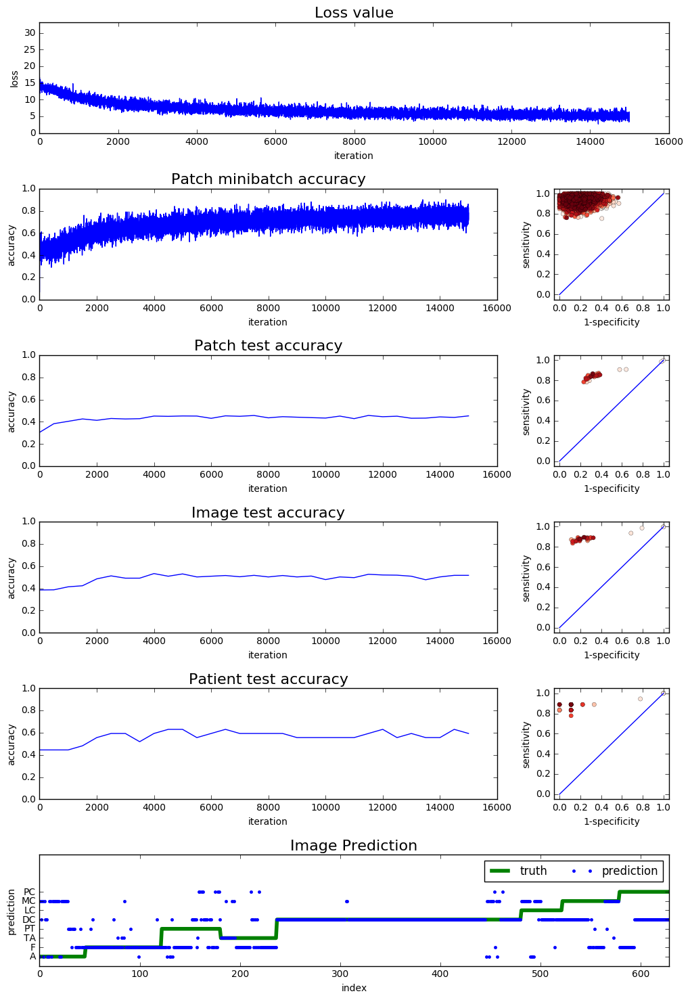

In [23]:
NUMBER_ITERATIONS = 15001
STRIDES = 'conv'
DROPOUT_KEEP = 1
CORRECTION = 0

(losses, acc_train_patch, sens_train_patch, spec_train_patch, acc_test_patch, sens_test_patch, spec_test_patch, acc_test_image, sens_test_image, spec_test_image, acc_test_patient, sens_test_patient, spec_test_patient, mean_batch_time, mean_test_time, cnf_matrix, W) = models.run_model_1(train_data_vec, train_labels_all, test_data_vec, test_labels_all, test_patients, 
                   DROPOUT_KEEP, NUMBER_ITERATIONS, PATCH_NUMBER, PATCH_SIZE,
                   strides=STRIDES, correction=CORRECTION)
sio.savemat('results_model_1_multi_image_size_'+str(IMAGE_SIZE[0])+'_'
            +str(IMAGE_SIZE[1])+'_magnification_'+MAGNIFICATION
            +'_fold_'+FOLD+'_strides_'+STRIDES+'_correction_'
            +str(CORRECTION)+'_dropoutkeep_'+str(DROPOUT_KEEP)+'.mat',
            {'losses':losses, 'acc_train_patch':acc_train_patch, 'sens_train_patch':sens_train_patch,
             'spec_train_patch':spec_train_patch, 'acc_test_patch':acc_test_patch, 'sens_test_patch':sens_test_patch,
             'spec_test_patch':spec_test_patch, 'acc_test_image':acc_test_image, 'sens_test_image':sens_test_image,
             'spec_test_image':spec_test_image, 'acc_test_patient':acc_test_patient, 'sens_test_patient':sens_test_patient,
             'spec_test_patient':spec_test_patient, 'mean_batch_time':mean_batch_time, 'mean_test_time':mean_test_time,
             'cnf_matrix':cnf_matrix, 'W':W})

## EVALUATION
</br>
<div style='text-align:justify'>
The evaluation of the models is actually done implicitly during the running of the models by visualising the results in real-time. Here, a summary of the results is given in the following table:
</div>


<table style="width:100%">
<tr> 
    <th> case </th>
    <th>binary, pool stride</th>
    <th>binary, conv stride </th>
    <th> binary, conv stride + correction  </th>
    <th> binary, conv stride + dropout  </th>
    <th> multi, conv stride </th>
    <th> multi, conv stride, IMAGE_SIZE_2  <th>
</tr>
<tr>
<th>Test accuracy patches</th>
<td>0.80</td>
<td>0.80</td>
<td>0.80</td>
<td>0.79</td>
<td>0.47</td>
<td>0.45</td>
</tr>
<tr>
<th>Test accuracy images</th>
<td>0.84</td>
<td>0.84</td>
<td>0.83</td>
<td>0.83</td>
<td>0.51</td>
<td>0.51</td>
<tr>
<th>Test accuracy patients</th>
<td>0.85</td>
<td>0.85</td>
<td>0.89</td>
<td>0.85</td>
<td>0.59</td>
<td>0.55</td>
</tr>
<tr>
<th>Test sensitivity patches</th>
<td>0.83</td>
<td>0.83</td>
<td>0.83</td>
<td>0.87</td>
<td>0.80</td>
<td>0.82</td>
</tr>
<tr>
<th>Test sensitivity images</th>
<td>0.85</td>
<td>0.85</td>
<td>0.85</td>
<td>0.90</td>
<td>0.83</td>
<td>0.89</td>
</tr>
<tr>
<th>Test sensitivity patients</th>
<td>0.83</td>
<td>0.83</td>
<td>0.89</td>
<td>0.89</td>
<td>0.83</td>
<td>0.90</td>
</tr>

</table>


<div style='text-align:justify'>
Neural networks are in general slow to train, but very rapid in the testing phase. In the of medical image classification, the training time is not important. However, along this project, timing and model complexity were reduced some times. This is purely due to the fact that this was a project with limited resources in terms of time and computing power, rather than a real-life application. For completeness, the training and testing times are reported below (16GB RAM, Intel i7):
</div>


<table style="width:100%">
<tr> 
    <th> case </th>
    <th>pool stride</th>
    <th> conv stride </th>
</tr>
<tr>
<th>Training [s/100 iterations]</th>
<td>22.2</td>
<td>6.5</td>
</tr>
<tr>
<th>Test [s/test set]</th>
<td>22.2</td>
<td>2.5</td>
</tr>
</table>

For a more thorough evaluation of the proposed methods, all magnification factors and train/test folds should be considered. Sadly, time did not allow doing this within the scope of this project.

## CONCLUSION
</br>
<div style='text-align:justify'>
In this project, breast cancer type classification was considered using the publically available BreaKHis dataset. After acquiring and reformating the data, basic exploration steps were done so as to get a sense for how the data look like and a touch of their basic properties. Convolutional neural networks were then used to achieve good classification accuracies based on this dataset. First, only the distinction between benign and malignant tumors was made, i.e. binary classification, and good accuracies were achieved even with a strongly simplified model compared to the literature. Then, also tumor subtype classification was attempted. The same network setup was used and it turned out that multi-class classification is very challenging for this dataset. Most probably more complex neural networks would be needed to achieve high subtype prediction accuracy. This again points at the main limitation in this project. Since both time and computational resources were limited, the complexity and amount of data had to be manageable on a personal laptop. Therefore, it should be noted that if a classification system as discussed here would be used in real life, all parameters could be upsized to achieve higher prediction accuracies. Nevertheless, even if the proposed networks are definitely not the optimal ones, interesting aspects of neural networks were highlighted in this project.
</div>

### Bibliography
[1] Fabio A. Spanhol, Luiz S. Oliveira, Caroline Petitjean, and Laurent Heutte. A dataset for breast cancer histopathological image classification. *IEEE Transactions on Biomedical Engineering*, 63(7):1455–1462, jul 2016.<br>
[2] Fabio A. Spanhol, Luiz S. Oliveira, Caroline Petitjean, and Laurent Heutte. Breast cancer histopathological image classification using convolutional neural networks. 2016.<br>
[3] Neslihan Bayramoglu, Juho Kannala, and Janne Heikkilä. Deep learning for magnification independent breast cancer histopathology image classification. 2016.